In [137]:
import pandas as pd
import numpy as np
from statistics import mean 

solving room number 217
792.0
0.1
792.0
0.1
792.0
0.1
792.0
0.1
792.0
0.1
792.0
0.1
792.0
0.1
792.0
0.1
2048.330626013414
40.0000000000003
1420.165313006707
1.5000000000000002
1420.1653130067073
2.0000000000000004
1420.165313006707
2.0000000000000004
1420.1653130067073
2.0000000000000004
1420.165313006707
2.0000000000000004
1420.1653130067073
2.0000000000000004
1420.165313006707
2.0000000000000004
1420.165313006707
0.4
1420.165313006707
0.4
1420.165313006707
0.4
1420.165313006707
0.4
1420.165313006707
0.4
1357.3487817060363
0.1
1300.8139035354327
0.1
1249.9325131818894
0.1
1204.1392618637005
0.1
1162.9253356773304
0.1
1125.8328021095974
0.1
1092.4495218986376
0.1
1062.4045697087738
0.1
1035.3641127378964
0.1
1011.0277014641068
0.1
989.1249313176961
0.1
1437.243338928556
4.100000000000001
1403.0872870848582
2.0000000000000004
1437.243338928556
2.0000000000000004
1403.0872870848582
2.0000000000000004
1437.243338928556
2.0000000000000004
1403.0872870848582
2.0000000000000004
1437.24333892

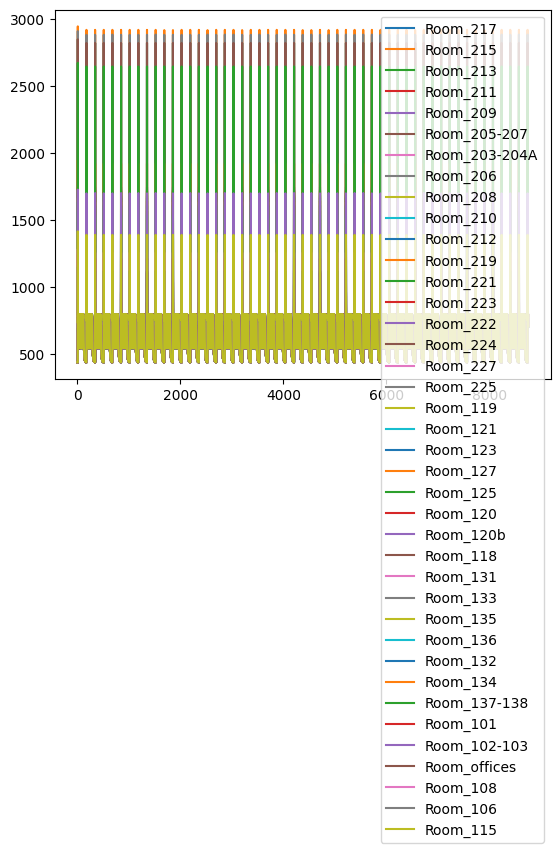

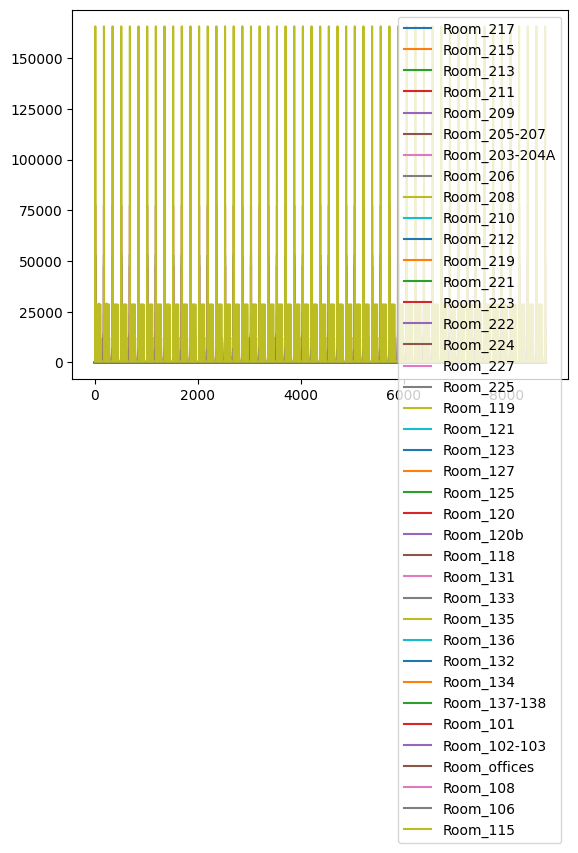

In [139]:
roomData = pd.read_csv('roomData.csv')
schedules = pd.read_csv('schedules.csv')

oa_ppm = 440*1.8
ppm_target = 800*1.8
initACH = 0.1


results = {}
ach_values = {}

for row in range(0,39,1):
    rm = roomData['Rm'].iloc[row]
    vol = roomData['Vol m3'].iloc[row]
    mg_hr_gen = roomData['ppm'].iloc[row]
    ct_1 = oa_ppm

    c_list = []
    achs = []
    print("solving room number " + str(rm))
    for hour in range(0,8759,1):
        occ = schedules['Gen Occ'].iloc[hour]
        ach = initACH
        c = ct_1 +((1*ach*oa_ppm) - (ach*ct_1) + ((mg_hr_gen*occ)/vol))
        while c > ppm_target:
            if ach < 40:
                ach = ach + 0.1
                c = ct_1 +((1*ach*oa_ppm) - (ach*ct_1) + ((mg_hr_gen*occ)/vol))
            else:
                break

        achs.append(ach*vol)
        c_list.append(c/1.8)
        ct_1 = c
        print(c)
        print(ach)

    room_name = (str('Room_') + str(rm))
    results[room_name] = c_list
    ach_values[room_name] = achs
    print("avg c = " + str((mean(c_list))))
    print("avg ach = " + str((mean(achs))))
results_df = pd.DataFrame.from_dict(results)
ach_df = pd.DataFrame.from_dict(ach_values)

results_df.plot.line(subplots=False)
ach_df.plot.line(subplots=False)

results_df.to_csv('C_Results.csv')
ach_df.to_csv('ACH_results.csv')